In [1]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
co.__version__

/Users/derekebowman/miniconda3/envs/celloracle_reboot/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


Could not check requirements.


'0.21.0'

In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc




In [3]:
from matplotlib_inline import backend_inline

backend_inline.set_matplotlib_formats("retina")
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]


In [4]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.figsize"] = [6, 4.5]

In [5]:
cd '/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/December2025/Male'

[Errno 2] No such file or directory: '/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/December2025/Male'
/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/December2025/CellOracle/Male


In [6]:
adata = sc.read('/Users/derekebowman/Coding Projects/taPVAT_snRNAseq_analysis/code/scVelo_and_CellOracle/CellOracle/Full_taPVAT_combined_annotated_with_immune_fibro_ecs_all_genes_unnormalized.h5ad')


In [7]:
adata

AnnData object with n_obs × n_vars = 71813 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [8]:
adata = adata[adata.obs['celltype'] == 'Adipocytes_Brown']
adata = adata[adata.obs['sex'] == 'M']
adata = adata[adata.obs['time'] == '8W']


In [9]:
adata

View of AnnData object with n_obs × n_vars = 8802 × 20743
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    layers: 'counts', 'raw_counts', 'soupX_counts'

In [10]:
def TimeDiet(row):
    if row['time'] == '8W' and row['diet'] == 'Control':
        return '8W_Control'
    elif row['time'] == '8W' and row['diet'] == 'HF':
        return '8W_HF'
    elif row['time'] == '24W' and row['diet'] == 'HF':
        return '24W_HF'
    elif row['time'] == '24W' and row['diet'] == 'Control':
        return '24W_Control'
    else:
        return 'There was an error'


In [11]:
# Apply the function to each row in adata.obs
adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_14305/774351158.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['time_diet'] = adata.obs.apply(TimeDiet, axis=1)


In [12]:
adata.obs[adata.obs.time_diet == 'There was an error']

,sample_id,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,...,MAP_9W,systolic_bp_9W,MAP_16W,systolic_bp_16W,MAP_24W,systolic_bp_24W,doublet,celltype,celltype_broad,time_diet


# CellOracle Preprocessing 
https://morris-lab.github.io/CellOracle.documentation/notebooks/03_scRNA-seq_data_preprocessing/scanpy_preprocessing_with_Paul_etal_2015_data.html#Notebook-file

In [13]:
# Only consider genes with more than 1 count
sc.pp.filter_genes(adata, min_counts=1)

In [14]:
# Normalize gene expression matrix with total UMI count per cell
sc.pp.normalize_per_cell(adata, key_n_counts='n_counts_all')

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_14305/2400592225.py:2: FutureWarning: Use sc.pp.normalize_total instead
  sc.pp.normalize_per_cell(adata, key_n_counts='n_counts_all')
/Users/derekebowman/miniconda3/envs/celloracle_reboot/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:588: FutureWarning: Use sc.pp.normalize_total instead
  normalize_per_cell(


In [15]:
# Select top 2000 highly-variable genes
filter_result = sc.pp.filter_genes_dispersion(adata.X,
                                              flavor='cell_ranger',
                                              n_top_genes=2000,
                                              log=False)

# Subset the genes
adata = adata[:, filter_result.gene_subset]

# Renormalize after filtering
sc.pp.normalize_per_cell(adata)



/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_14305/2343311291.py:2: FutureWarning: Use sc.pp.highly_variable_genes instead
  filter_result = sc.pp.filter_genes_dispersion(adata.X,
/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_14305/2343311291.py:11: FutureWarning: Use sc.pp.normalize_total instead
  sc.pp.normalize_per_cell(adata)
/Users/derekebowman/miniconda3/envs/celloracle_reboot/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:585: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[key_n_counts] = counts_per_cell
/Users/derekebowman/miniconda3/envs/celloracle_reboot/lib/python3.11/site-packages/scanpy/preprocessing/_simple.py:588: FutureWarning: Use sc.pp.normalize_total instead
  normalize_per_cell(


In [16]:
# keep raw cont data before log transformation
adata.raw = adata
adata.layers["raw_count"] = adata.raw.X.copy()
# Log transformation and scaling
sc.pp.log1p(adata)
sc.pp.scale(adata)

In [17]:
# PCA
sc.tl.pca(adata, svd_solver='arpack')

# Diffusion map
sc.pp.neighbors(adata, n_neighbors=4, n_pcs=20)

sc.tl.diffmap(adata)
# Calculate neihbors again based on diffusionmap
sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_diffmap')

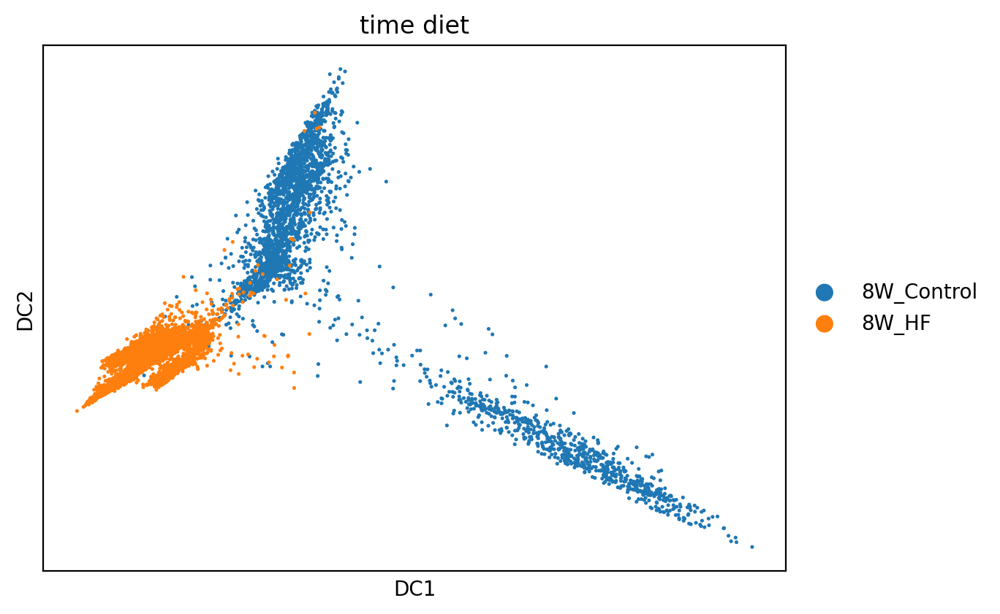

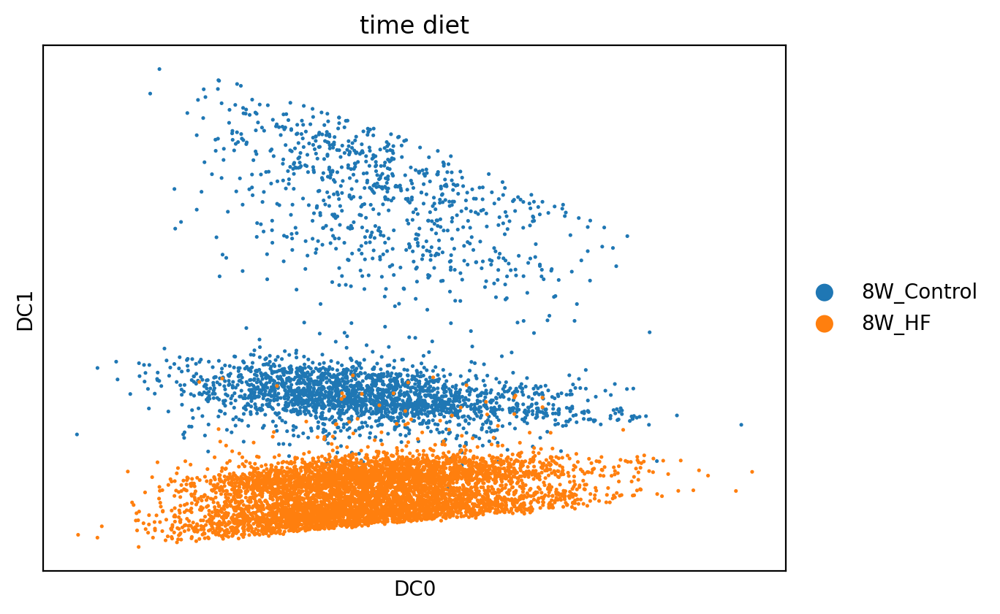

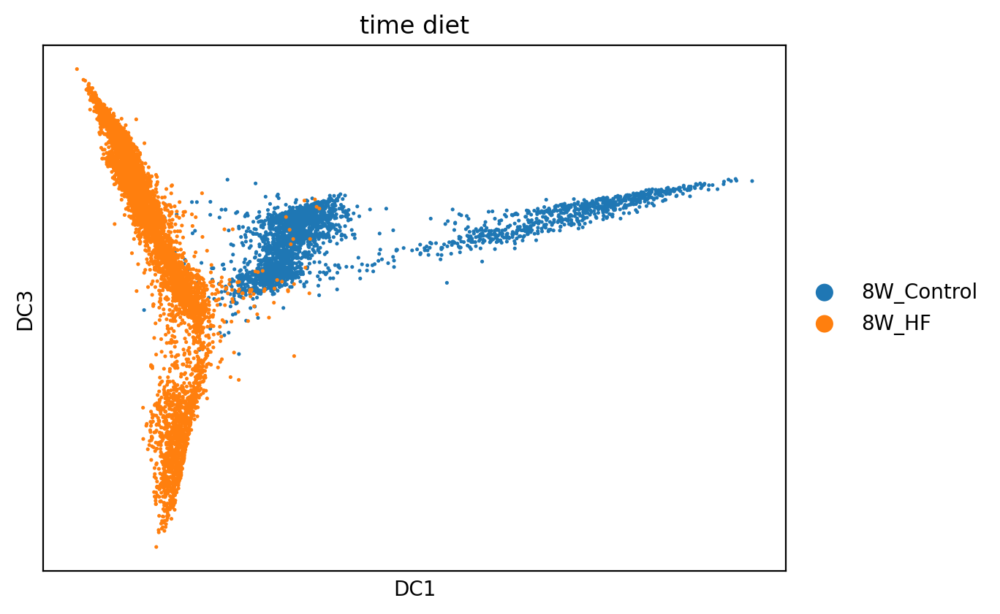

In [18]:
# Taking a look at the diffusion map plots
sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,2])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [0,1])

sc.pl.scatter(adata, 
              basis="diffmap", 
              color=["time_diet"],
              components= [1,3])


In [19]:
# Using leiden instead of louvain
sc.tl.leiden(adata, resolution=0.8)

/var/folders/3v/fv2nh3dj3z9b9bkz4lcmhvq80000gn/T/ipykernel_14305/1054681846.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.8)


In [20]:
# PAGA graph construction
sc.tl.paga(adata, groups='leiden')

In [21]:
plt.rcParams["figure.figsize"] = [6, 4.5]

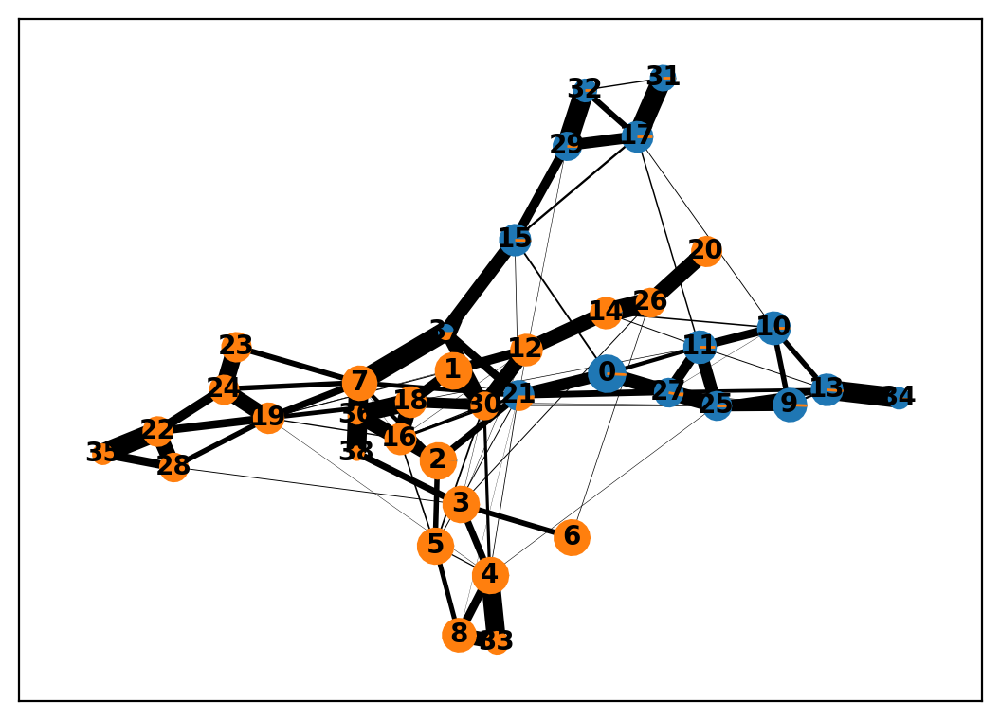

In [22]:
sc.pl.paga(adata, color = 'time_diet')

In [23]:
sc.tl.draw_graph(adata, init_pos='paga', random_state=123)



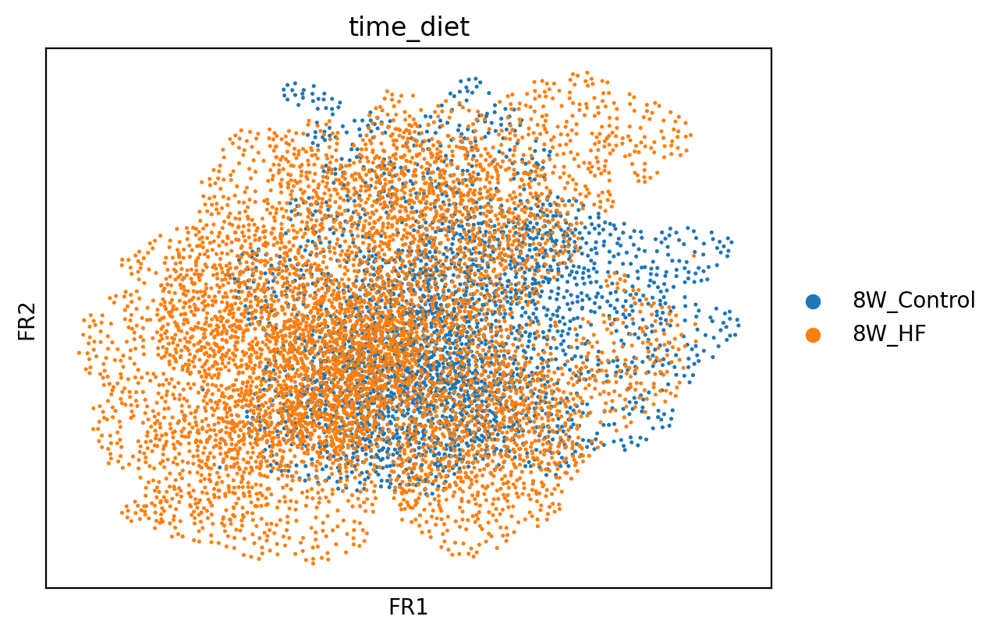

In [24]:
sc.pl.draw_graph(adata, color='time_diet', legend_loc='right margin')



In [25]:
# Save data if desired
# adata.write_h5ad("Your_File_Name_Here.h5ad")

# Preprocessing complete, now Pseudotime Calculation

https://cellrank.readthedocs.io/en/latest/notebooks/tutorials/kernels/300_pseudotime.html

https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Pseudotime_calculation_with_Paul_etal_2015_data.html



In [26]:
import copy
import glob
import time
import os
import shutil
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from tqdm.auto import tqdm

In [27]:
import celloracle as co
from celloracle.applications import Pseudotime_calculator
co.__version__

'0.21.0'

In [28]:
# Since I could not install fa2, 
# I am creating a new column called X_draw_graph_fa
# that is equivalent to X_draw_graph_fr
adata.obsm['X_draw_graph_fa'] = adata.obsm['X_draw_graph_fr'].copy()

In [29]:
adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa

In [30]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [5,5]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 300

%matplotlib inline

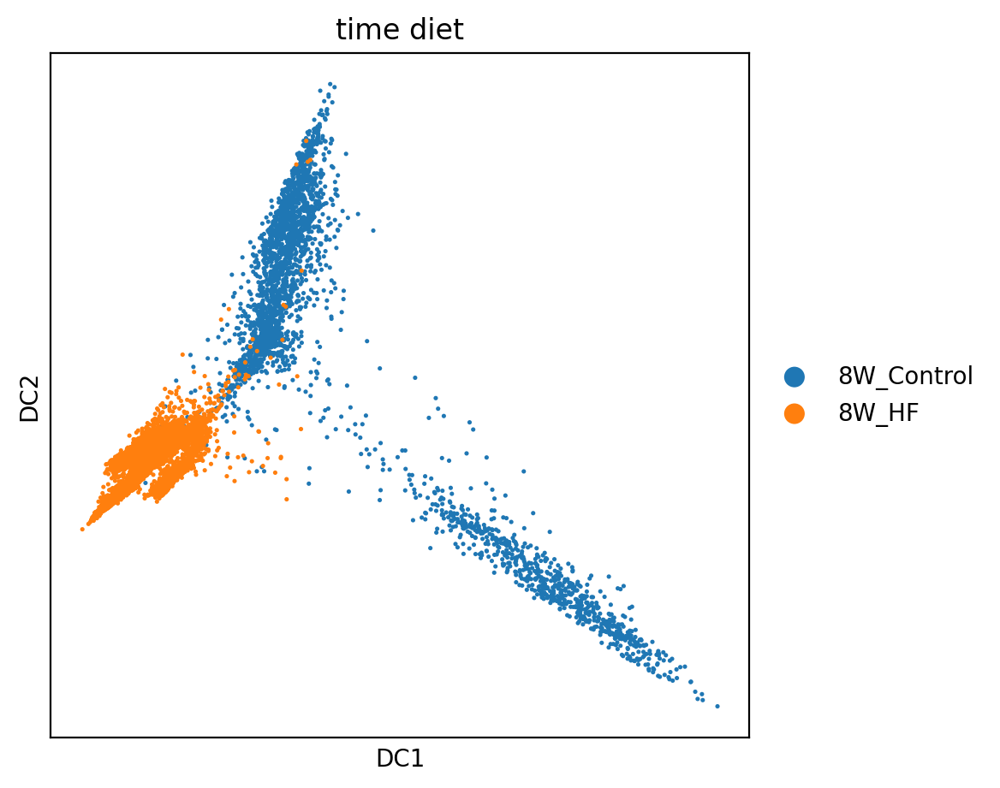

In [31]:
# Plot diffusion map by diet
sc.pl.scatter(adata, 
              basis="diffmap", 
              color="time_diet")

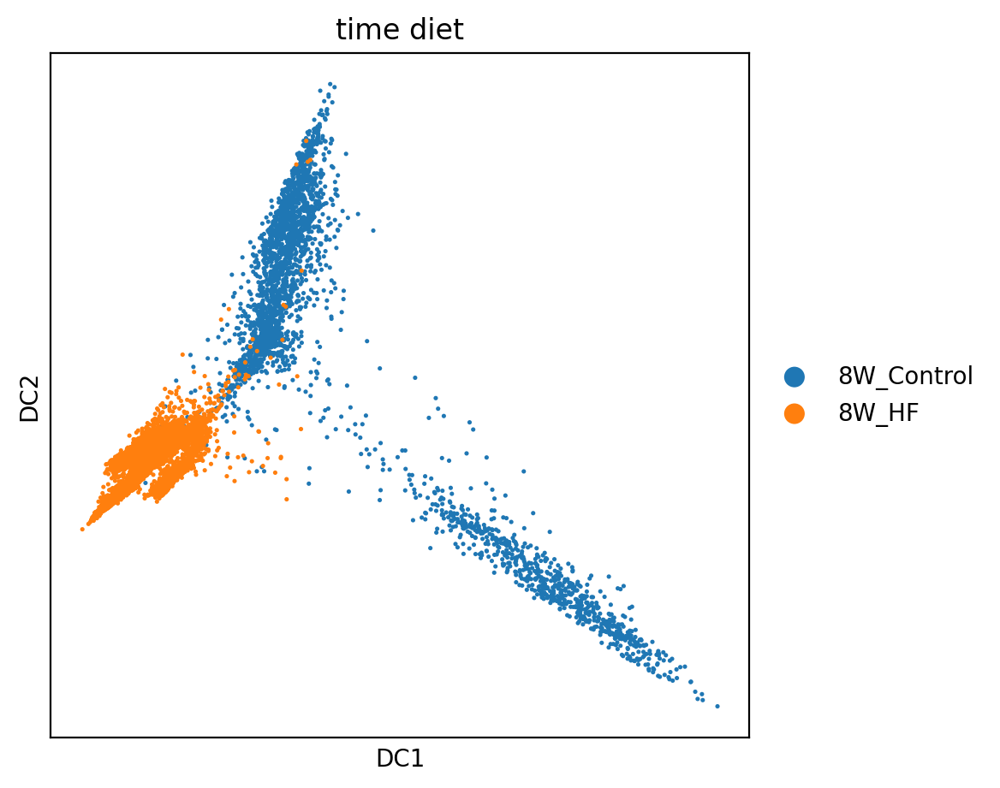

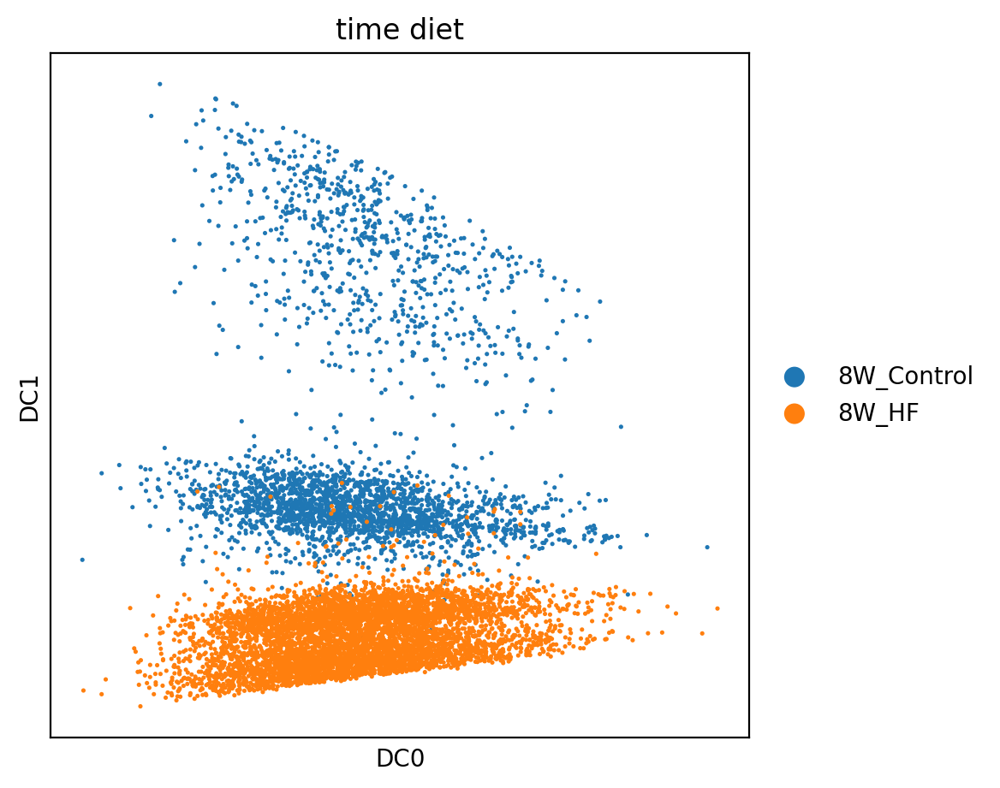

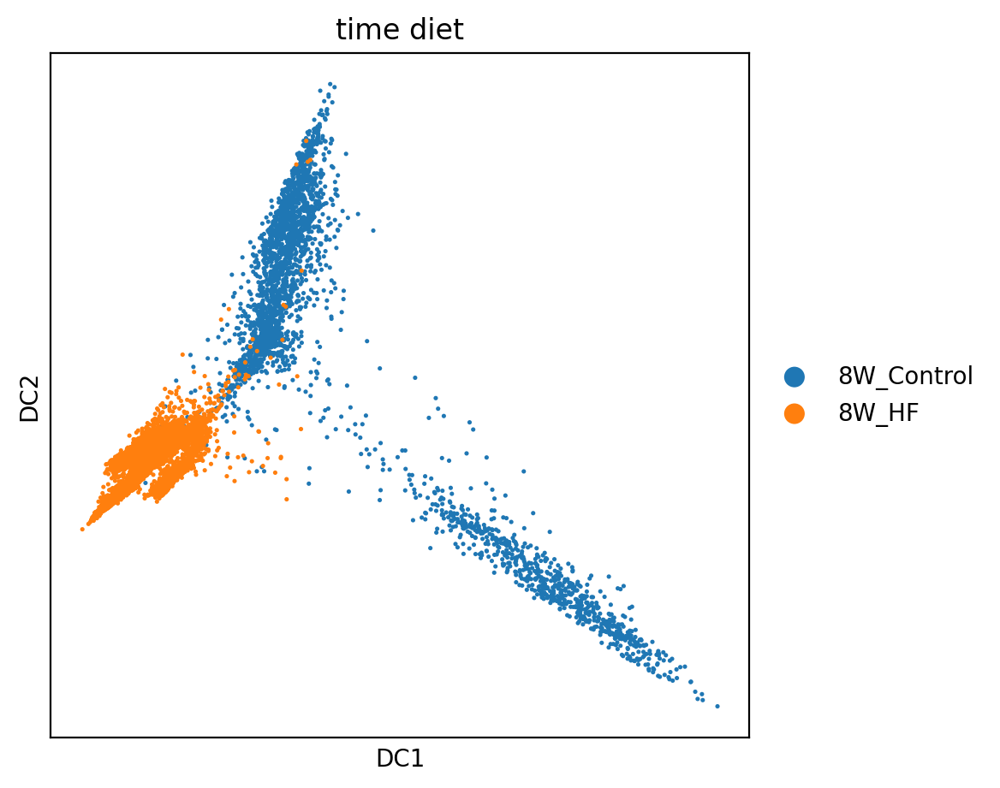

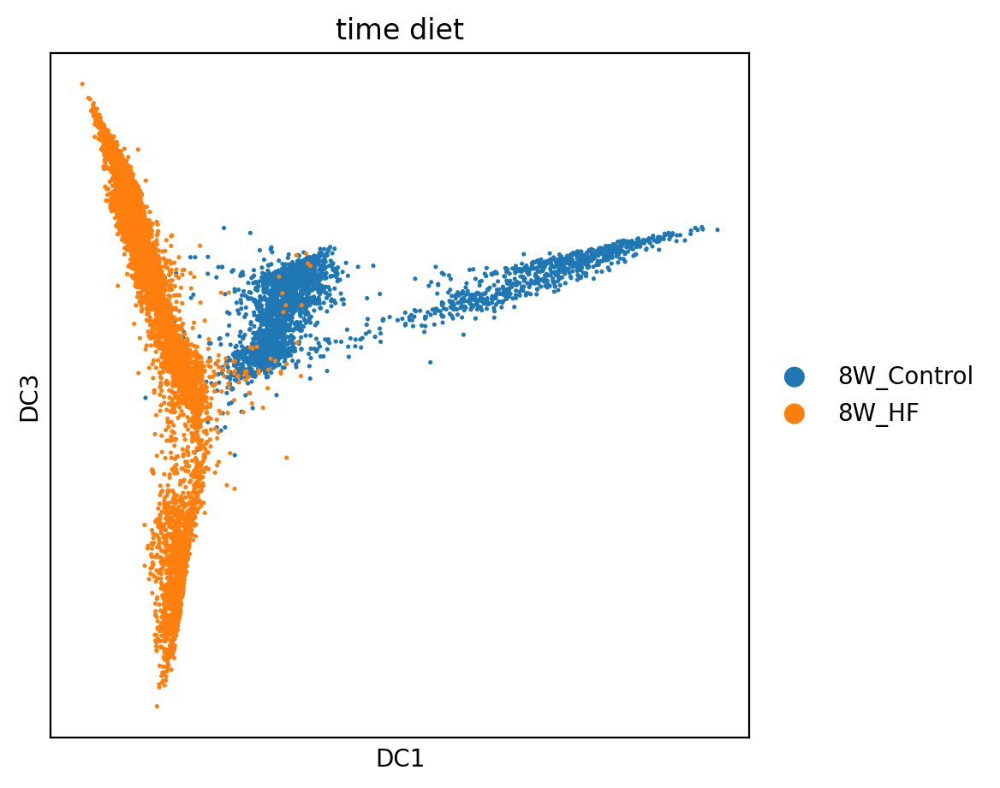

In [32]:
# Setting root cell to the cell with min DC1 value (8W_Control).
root_ixs =adata.obsm["X_diffmap"][:, 1].argmax()

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"])

sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[0, 1],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 2],
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["time_diet"],
    components=[1, 3],
)
adata.uns["iroot"] = root_ixs

In [33]:
sc.tl.dpt(adata) 

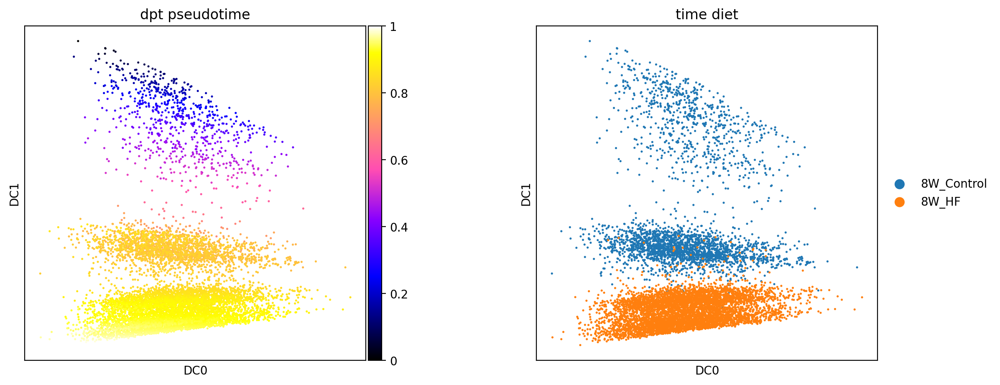

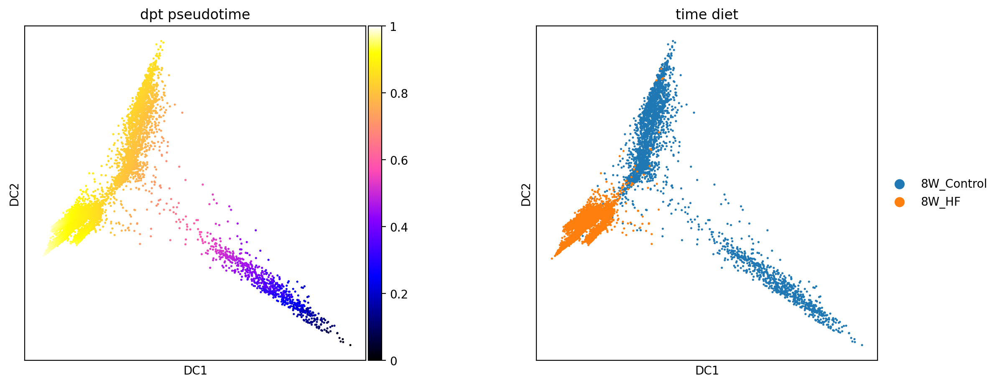

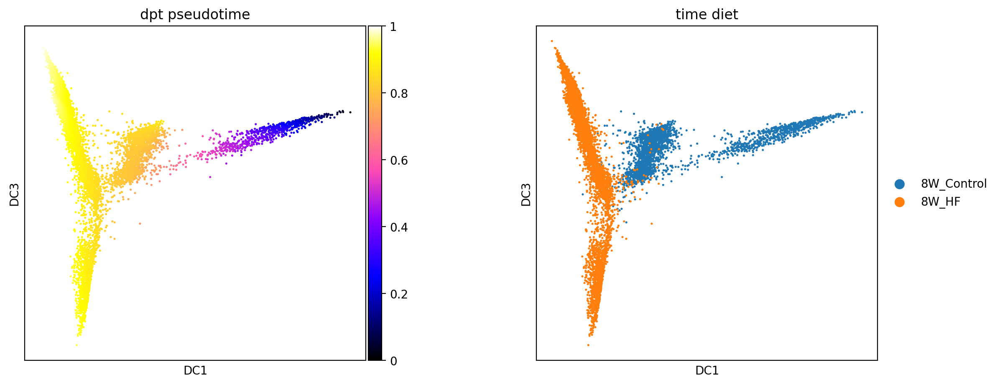

In [34]:
# Plot psedotime on diffusion map
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[0,1]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 2]
)
sc.pl.scatter(
    adata,
    basis="diffmap",
    color=["dpt_pseudotime", "time_diet"],
    color_map="gnuplot2",
     components=[1, 3]
)

In [35]:
sc.tl.umap(adata)

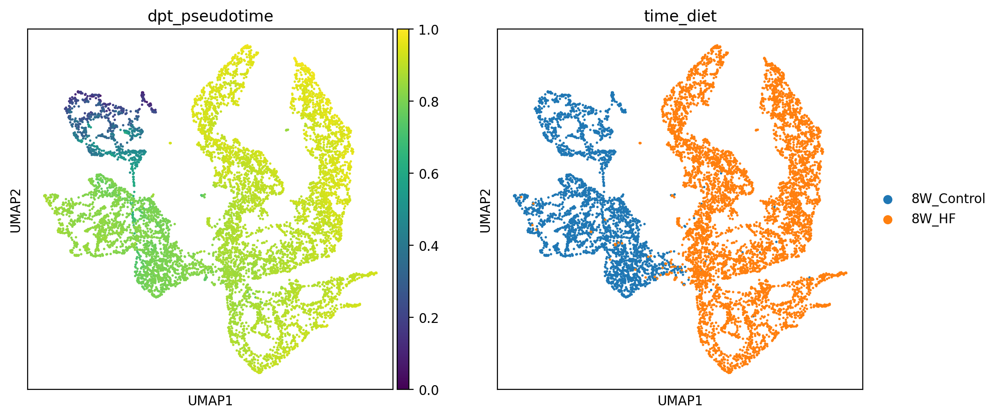

In [36]:
sc.pl.umap(adata, color=['dpt_pseudotime', 'time_diet'],ncols=2)

# Starting GRN Model Construction and Network Analysis 
https://morris-lab.github.io/CellOracle.documentation/notebooks/04_Network_analysis/Network_analysis_with_Paul_etal_2015_data.html

In [37]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns


import celloracle as co
co.__version__



'0.21.0'

In [38]:
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300

In [39]:
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)



In [40]:
# Load the built int rat promoter base GRN.
base_GRN = co.data.load_rat_promoter_base_GRN()

# Check data
base_GRN.head()



Loading prebuilt promoter base-GRN. Version: rn6_gimmemotifsv5_fpr2


,peak_id,gene_short_name,9430076c15rik,Ac002126.6,Ac012531.1,Ac226150.2,Afp,Ahr,Ahrr,Aire,...,Znf784,Znf8,Znf816,Znf85,Zscan10,Zscan16,Zscan22,Zscan26,Zscan31,Zscan4
0,chr10_101287528_101288628,Sox9,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,chr10_101696238_101697338,Mir297,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
2,chr10_102083380_102084480,Slc39a11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,chr10_102135283_102136383,Sstr2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,chr10_102166771_102167871,Cog1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [41]:
# Instantiate Oracle object
oracle = co.Oracle()

In [42]:
# In this notebook, we use the unscaled mRNA count for the input of Oracle object.
adata.X = adata.layers["raw_count"].copy()

# Instantiate Oracle object.
oracle.import_anndata_as_raw_count(adata=adata,
                                   cluster_column_name="time_diet",
                                   embedding_name="X_diffmap")

In [43]:
oracle.import_TF_data(TF_info_matrix=base_GRN)

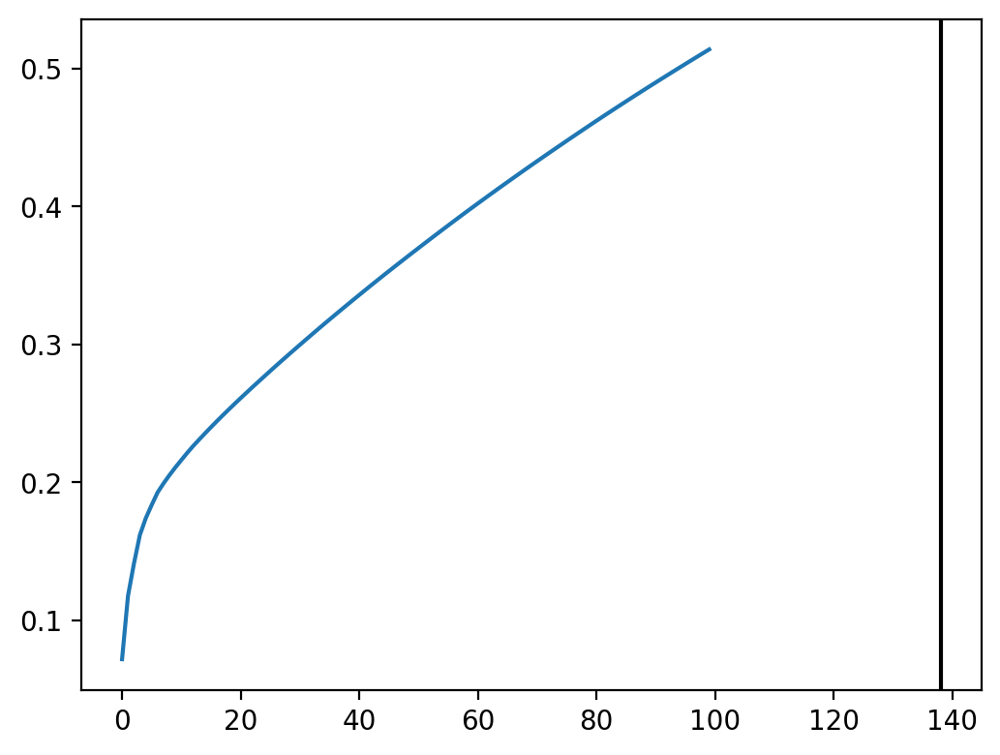

138


In [44]:
# Perform PCA
oracle.perform_PCA()

# Select important PCs
plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 50)



In [45]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")

cell number is :8802


In [46]:
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")


Auto-selected k is :220


In [47]:
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=-1)

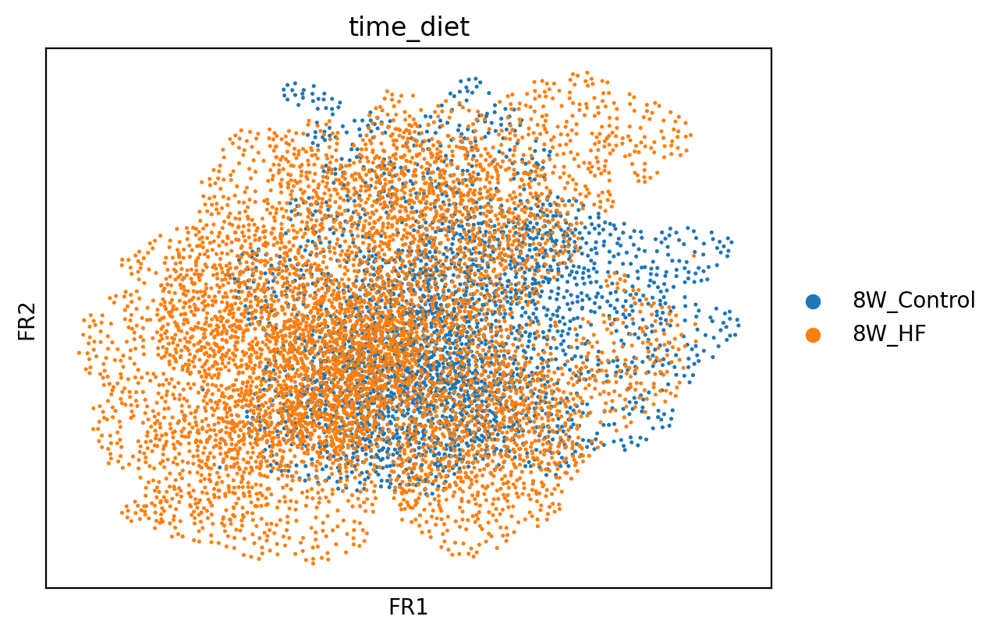

In [48]:
# Check clustering data
sc.pl.draw_graph(oracle.adata, color="time_diet")

In [49]:
%%time
# This step may take some time.(~30 minutes)
links = oracle.get_links(cluster_name_for_GRN_unit="time_diet", alpha=10,
                         verbose_level=10, n_jobs=-1)



  0%|          | 0/2 [00:00<?, ?it/s]

Inferring GRN for 8W_Control...


  0%|          | 0/1348 [00:00<?, ?it/s]

Inferring GRN for 8W_HF...


  0%|          | 0/1348 [00:00<?, ?it/s]

CPU times: user 32 s, sys: 3.82 s, total: 35.9 s
Wall time: 1min 8s


In [50]:
links.links_dict.keys()



dict_keys(['8W_Control', '8W_HF'])

In [51]:
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [52]:
HF_8W_GRN = links.filtered_links['8W_HF']
HF_8W_GRN['source'].nunique()

66

In [53]:
Control_8W_GRN = links.filtered_links['8W_Control']
Control_8W_GRN['source'].nunique()

65

In [54]:
plt.rcParams["figure.figsize"] = [9, 4.5]

8W_Control


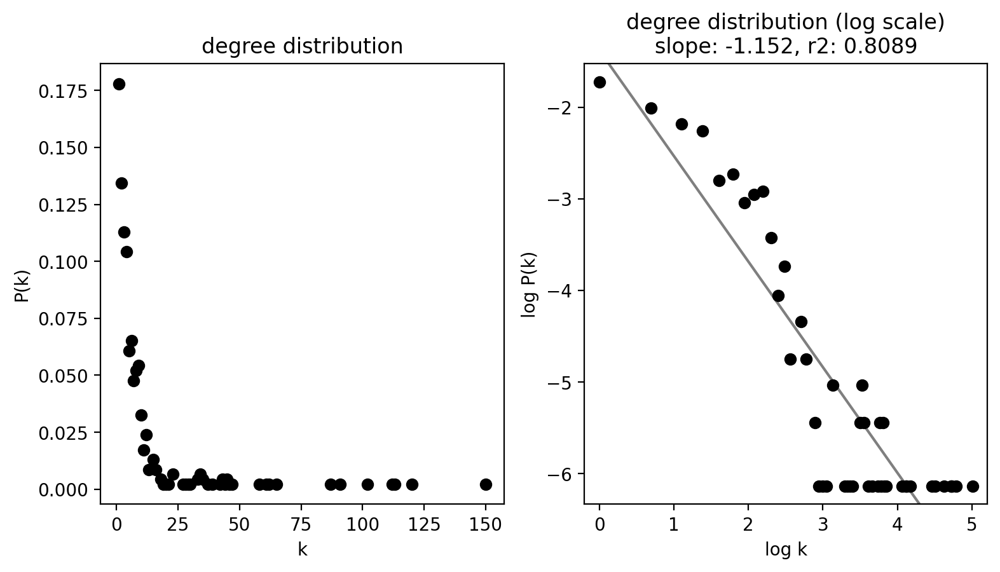

8W_HF


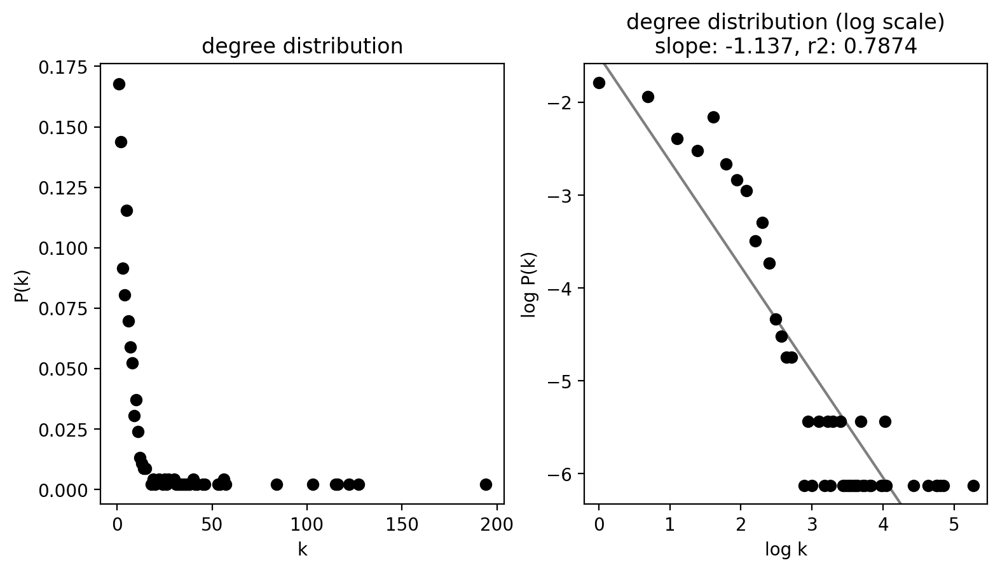

In [55]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )



In [56]:
plt.rcParams["figure.figsize"] = [6, 4.5]


# Calculate network scores.
links.get_network_score()



In [57]:
TFs = oracle.adata.var[oracle.adata.var['isin_TFdict_regulators']].index

In [58]:
TFs

Index(['Ar', 'Arid5b', 'Barx2', 'Batf', 'Bhlhe40', 'Cdx2', 'Cebpb', 'Dux4',
       'E2f1', 'E2f7', 'Ebf1', 'Eomes', 'Ezh2', 'Fli1', 'Foxa2', 'Foxo1',
       'Foxo3', 'Gata3', 'Glis3', 'Hivep1', 'Hivep2', 'Hlx', 'Hmga2', 'Hsf4',
       'Ikzf3', 'Irx2', 'Lbx2', 'Maf', 'Mbd1', 'Mecom', 'Mef2c', 'Meis3',
       'Mxi1', 'Myc', 'Nfe2', 'Nfia', 'Npas3', 'Nr2c2', 'Nr4a1', 'Nr4a2',
       'Pax6', 'Phox2a', 'Plagl1', 'Pou3f2', 'Ppara', 'Pparg', 'Ppargc1a',
       'Prdm11', 'Prdm16', 'Prrx1', 'Pten', 'Rax', 'Rfx5', 'Runx1', 'Rxrg',
       'Scrt1', 'Sim1', 'Six2', 'Smarca1', 'Sox10', 'Sox21', 'Sp5', 'Spic',
       'Stat2', 'Stat3', 'Stat5a', 'Tbx5', 'Tcf7l1', 'Tead1', 'Tead2',
       'Trim28', 'Vdr', 'Xbp1', 'Ybx2', 'Zbtb16', 'Zscan10'],
      dtype='object')

In [59]:
links_df = links.merged_score.copy()

In [60]:
links_df

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Npas3,61,0.132609,0,0.000000,61,0.132609,0.0,0.319080,8W_Control
Ntrk3,15,0.032609,15,0.032609,0,0.000000,0.0,0.210570,8W_Control
Ebf1,113,0.245652,11,0.023913,102,0.221739,3440.0,1.000000,8W_Control
Acly,8,0.017391,8,0.017391,0,0.000000,0.0,0.524977,8W_Control
Tead1,34,0.073913,11,0.023913,23,0.050000,1470.0,0.434390,8W_Control
...,...,...,...,...,...,...,...,...,...
Ube2q1,1,0.002183,1,0.002183,0,0.000000,0.0,0.000469,8W_HF
Smarca2,1,0.002183,1,0.002183,0,0.000000,0.0,0.001493,8W_HF
Ftsj3,1,0.002183,1,0.002183,0,0.000000,0.0,0.001489,8W_HF
Kcnq5,1,0.002183,1,0.002183,0,0.000000,0.0,0.004219,8W_HF


In [61]:
# Creating a dataframe that includes only transcription factors
TF_links_df = links_df.loc[links_df.index.isin(TFs)]


In [62]:
TF_links_df 

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Npas3,61,0.132609,0,0.000000,61,0.132609,0.0,0.319080,8W_Control
Ebf1,113,0.245652,11,0.023913,102,0.221739,3440.0,1.000000,8W_Control
Tead1,34,0.073913,11,0.023913,23,0.050000,1470.0,0.434390,8W_Control
Rxrg,66,0.143478,2,0.004348,64,0.139130,2038.0,0.285844,8W_Control
Bhlhe40,152,0.330435,4,0.008696,148,0.321739,2394.0,0.727397,8W_Control
...,...,...,...,...,...,...,...,...,...
Batf,6,0.013100,0,0.000000,6,0.013100,0.0,0.006556,8W_HF
Ikzf3,2,0.004367,0,0.000000,2,0.004367,0.0,0.005465,8W_HF
Eomes,4,0.008734,0,0.000000,4,0.008734,0.0,0.004949,8W_HF
Barx2,1,0.002183,0,0.000000,1,0.002183,0.0,0.000424,8W_HF


In [63]:
# Creating separate DataFrames for each cluster
df_8W_HF = TF_links_df [TF_links_df['cluster'] == '8W_HF']
df_8W_Control = TF_links_df [TF_links_df ['cluster'] == '8W_Control']

In [64]:
df_8W_Control

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Npas3,61,0.132609,0,0.000000,61,0.132609,0.0,0.319080,8W_Control
Ebf1,113,0.245652,11,0.023913,102,0.221739,3440.0,1.000000,8W_Control
Tead1,34,0.073913,11,0.023913,23,0.050000,1470.0,0.434390,8W_Control
Rxrg,66,0.143478,2,0.004348,64,0.139130,2038.0,0.285844,8W_Control
Bhlhe40,152,0.330435,4,0.008696,148,0.321739,2394.0,0.727397,8W_Control
...,...,...,...,...,...,...,...,...,...
Sox21,5,0.010870,0,0.000000,5,0.010870,0.0,0.008830,8W_Control
Scrt1,3,0.006522,0,0.000000,3,0.006522,0.0,0.002740,8W_Control
Hmga2,1,0.002174,0,0.000000,1,0.002174,0.0,0.000635,8W_Control
Gata3,1,0.002174,0,0.000000,1,0.002174,0.0,0.000532,8W_Control


In [65]:
df_8W_HF

,degree_all,degree_centrality_all,degree_in,degree_centrality_in,degree_out,degree_centrality_out,betweenness_centrality,eigenvector_centrality,cluster
Bhlhe40,195,0.425764,3,0.006550,192,0.419214,7440.0,1.000000,8W_HF
Pten,21,0.045852,9,0.019651,12,0.026201,1524.0,0.530530,8W_HF
Foxo1,40,0.087336,13,0.028384,27,0.058952,2410.0,0.297268,8W_HF
Ppargc1a,56,0.122271,6,0.013100,50,0.109170,3093.0,0.340530,8W_HF
Ebf1,128,0.279476,14,0.030568,114,0.248908,2769.0,0.720905,8W_HF
...,...,...,...,...,...,...,...,...,...
Batf,6,0.013100,0,0.000000,6,0.013100,0.0,0.006556,8W_HF
Ikzf3,2,0.004367,0,0.000000,2,0.004367,0.0,0.005465,8W_HF
Eomes,4,0.008734,0,0.000000,4,0.008734,0.0,0.004949,8W_HF
Barx2,1,0.002183,0,0.000000,1,0.002183,0.0,0.000424,8W_HF


In [66]:
# Create separate dataframes to append the ratio data to.

ratios_8W_HF_vs_8W_Control = pd.DataFrame(index=df_8W_HF.index)


In [67]:
# Calculate ratios for each centrality measure
for measure in ['eigenvector_centrality', 'betweenness_centrality','degree_centrality_all', 'degree_centrality_out']:
    # Replace zero values with np.nan to avoid division by zero
    
    safe_8W_Control = df_8W_Control[measure].replace(0, np.nan)
    
    # Calculate the ratios
    ratios_8W_HF_vs_8W_Control[measure] = df_8W_HF[measure] / safe_8W_Control
    


# Drop NaN values that might have resulted from division by zero
    ratios_8W_HF_vs_8W_Control.dropna(inplace=True)


top_20_tfs_8W_HF_vs_8W_Control = ratios_8W_HF_vs_8W_Control.sort_values('degree_centrality_out',ascending=False).head(20)

print("8W_HF vs. 8W_Control:", top_20_tfs_8W_HF_vs_8W_Control)






top_20_tfs_8W_HF_vs_8W_Control  = top_20_tfs_8W_HF_vs_8W_Control.rename(columns={'eigenvector_centrality': 'eigenvector_centrality_ratio', 
                                                                        'betweenness_centrality': 'betweenness_centrality_ratio',
                                                                        'degree_centrality_all': 'degree_centrality_all_ratio',
                                                                        'degree_centrality_out': 'degree_centrality_out_ratio'})

print("8W_HF vs. 8W_Control:", top_20_tfs_8W_HF_vs_8W_Control)



8W_HF vs. 8W_Control:           eigenvector_centrality  betweenness_centrality  \
Hivep1                  1.212814                1.521898   
Ybx2                    0.963389                1.862069   
Tcf7l1                  1.543104                1.728000   
Nr4a1                   0.658206                3.764444   
Hlx                     1.201621                3.559322   
Hivep2                  0.908647                0.200000   
Bhlhe40                 1.374765                3.107769   
Trim28                  0.754825                0.197010   
Nr2c2                   0.643236                3.930328   
Ebf1                    0.720905                0.804942   
Cebpb                   0.652574                1.760279   
Nfia                    0.384540               13.690789   
Ppargc1a                0.853380                1.892901   
Ezh2                    0.949064                0.097983   
Stat5a                  0.822788                6.351832   
Nr4a2             

In [68]:
sorted_by_eigenvector_top_20_tfs_8W_HF_vs_8W_Control = top_20_tfs_8W_HF_vs_8W_Control.sort_values('eigenvector_centrality_ratio', ascending=False)
sorted_by_degree_centrality_out_top_20_tfs_8W_HF_vs_8W_Control= top_20_tfs_8W_HF_vs_8W_Control.sort_values('degree_centrality_out_ratio', ascending=False)
sorted_by_betweenness_centrality_top_20_tfs_8W_HF_vs_8W_Control = top_20_tfs_8W_HF_vs_8W_Control.sort_values('betweenness_centrality_ratio', ascending=False)


In [69]:
#print(sorted_by_eigenvector_top_20_tfs_24W_HF_vs_24W_Control)
print(sorted_by_degree_centrality_out_top_20_tfs_8W_HF_vs_8W_Control)
sorted_by_betweenness_centrality_top_20_tfs_8W_HF_vs_8W_Control

          eigenvector_centrality_ratio  betweenness_centrality_ratio  \
Hivep1                        1.212814                      1.521898   
Ybx2                          0.963389                      1.862069   
Tcf7l1                        1.543104                      1.728000   
Nr4a1                         0.658206                      3.764444   
Hlx                           1.201621                      3.559322   
Hivep2                        0.908647                      0.200000   
Bhlhe40                       1.374765                      3.107769   
Trim28                        0.754825                      0.197010   
Nr2c2                         0.643236                      3.930328   
Ebf1                          0.720905                      0.804942   
Cebpb                         0.652574                      1.760279   
Nfia                          0.384540                     13.690789   
Ppargc1a                      0.853380                      1.89

,eigenvector_centrality_ratio,betweenness_centrality_ratio,degree_centrality_all_ratio,degree_centrality_out_ratio
Nfia,0.384540,13.690789,0.974827,1.046215
Ppara,1.387495,8.665480,1.074439,0.945286
Stat5a,0.822788,6.351832,1.108267,0.968497
Foxo1,0.740860,4.184028,0.913061,0.874771
Nr2c2,0.643236,3.930328,1.132374,1.126108
Nr4a1,0.658206,3.764444,1.301957,1.397380
Hlx,1.201621,3.559322,1.434810,1.339156
Bhlhe40,1.374765,3.107769,1.288497,1.302962
Ar,0.832657,2.287293,0.899745,0.892770
Ppargc1a,0.853380,1.892901,0.969733,1.024864


In [70]:
eigenvector_sorted_gene_list_8W_HF_vs_8W_Control= list(sorted_by_eigenvector_top_20_tfs_8W_HF_vs_8W_Control.index)
degree_centrality_out_sorted_gene_list_8W_HF_vs_8W_Control = list(sorted_by_degree_centrality_out_top_20_tfs_8W_HF_vs_8W_Control.index)
betweenness_centrality_sorted_gene_list_8W_HF_vs_8W_Control = list(sorted_by_betweenness_centrality_top_20_tfs_8W_HF_vs_8W_Control.index)

In [71]:
# Map genes to their positions in each list
positions_eigenvector_sorted_8W_HF_vs_8W_Control = {gene: i for i, gene in enumerate(eigenvector_sorted_gene_list_8W_HF_vs_8W_Control)}
positions_degree_centrality_out_sorted_8W_HF_vs_8W_Control  = {gene: i for i, gene in enumerate(degree_centrality_out_sorted_gene_list_8W_HF_vs_8W_Control)}
positions_betweenness_centrality_sorted_8W_HF_vs_8W_Control= { gene: i for i, gene in enumerate(betweenness_centrality_sorted_gene_list_8W_HF_vs_8W_Control)}
print("Positions based on eigenvector:", positions_eigenvector_sorted_8W_HF_vs_8W_Control)
print("Positions based on degree centrality out:", positions_degree_centrality_out_sorted_8W_HF_vs_8W_Control)
print("Positions based on betweenness centrality:",positions_betweenness_centrality_sorted_8W_HF_vs_8W_Control)


Positions based on eigenvector: {'Tcf7l1': 0, 'Ppara': 1, 'Bhlhe40': 2, 'Hivep1': 3, 'Hlx': 4, 'Mecom': 5, 'Ybx2': 6, 'Ezh2': 7, 'Hivep2': 8, 'Ppargc1a': 9, 'Ar': 10, 'Stat5a': 11, 'Trim28': 12, 'Foxo1': 13, 'Ebf1': 14, 'Nr4a1': 15, 'Cebpb': 16, 'Nr2c2': 17, 'Nr4a2': 18, 'Nfia': 19}
Positions based on degree centrality out: {'Hivep1': 0, 'Ybx2': 1, 'Tcf7l1': 2, 'Nr4a1': 3, 'Hlx': 4, 'Hivep2': 5, 'Bhlhe40': 6, 'Trim28': 7, 'Nr2c2': 8, 'Ebf1': 9, 'Cebpb': 10, 'Nfia': 11, 'Ppargc1a': 12, 'Ezh2': 13, 'Stat5a': 14, 'Nr4a2': 15, 'Ppara': 16, 'Ar': 17, 'Mecom': 18, 'Foxo1': 19}
Positions based on betweenness centrality: {'Nfia': 0, 'Ppara': 1, 'Stat5a': 2, 'Foxo1': 3, 'Nr2c2': 4, 'Nr4a1': 5, 'Hlx': 6, 'Bhlhe40': 7, 'Ar': 8, 'Ppargc1a': 9, 'Ybx2': 10, 'Mecom': 11, 'Cebpb': 12, 'Tcf7l1': 13, 'Hivep1': 14, 'Ebf1': 15, 'Hivep2': 16, 'Trim28': 17, 'Ezh2': 18, 'Nr4a2': 19}


In [72]:
# Create a DataFrame with genes as the index and positions as the columns
positions_8W_HF_vs_8W_Control = pd.DataFrame({'Eigenvector_Centrality_Rank': positions_eigenvector_sorted_8W_HF_vs_8W_Control, 
                                          'Degree_Centrality_Out_Rank': positions_degree_centrality_out_sorted_8W_HF_vs_8W_Control,
                                          'Betweenness_Centrality_Rank': positions_betweenness_centrality_sorted_8W_HF_vs_8W_Control})

positions_8W_HF_vs_8W_Control['Total_Ranking_Score'] = positions_8W_HF_vs_8W_Control.sum(axis=1)

positions_8W_HF_vs_8W_Control = positions_8W_HF_vs_8W_Control.sort_values('Total_Ranking_Score', ascending=True)

In [73]:
positions_8W_HF_vs_8W_Control

,Eigenvector_Centrality_Rank,Degree_Centrality_Out_Rank,Betweenness_Centrality_Rank,Total_Ranking_Score
Hlx,4,4,6,14
Tcf7l1,0,2,13,15
Bhlhe40,2,6,7,15
Hivep1,3,0,14,17
Ybx2,6,1,10,17
Ppara,1,16,1,18
Nr4a1,15,3,5,23
Stat5a,11,14,2,27
Nr2c2,17,8,4,29
Hivep2,8,5,16,29


In [74]:
HF_TFs = list(df_8W_HF.index)
Control_TFs = list(df_8W_Control.index)

In [75]:
Only_HF_TFs = list(set(HF_TFs) - set(Control_TFs))

In [76]:
Only_HF_TFs

['Six2', 'Barx2', 'Smarca1']

# Save links and oracles object (optional)

In [77]:
#links.to_hdf5(file_path="Oct_Males_Only_8WC_8W_HF.celloracle.links")
#oracle.to_hdf5(file_path="Oct_Males_Only_8WC_8W_HF.celloracle.oracle")

# In Silico Gene Perturbation with GRNs
https://morris-lab.github.io/CellOracle.documentation/notebooks/05_simulation/Gata1_KO_simulation_with_Paul_etal_2015_data.html#Notebook-file

In [78]:
import os
import sys
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co
co.__version__


'0.21.0'

In [79]:
#plt.rcParams["font.family"] = "arial"
plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600

%matplotlib inline



In [80]:
# Make folder to save plots
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)



# Load the links and oracle datasets, if you've already generated them

In [81]:
# Attention!! Please use the function below when you use your data.
#oracle = co.load_hdf5('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/8W_Control_vs_8W_HF/Oct_Males_Only_8WC_8W_HF.celloracle.oracle')
# Attention!! Please use the function below when you use your data.
#links = co.load_hdf5('/Users/derekebowman/Coding Projects/PVAT_Paper_Sept_5_scVelo_CellOracle/CellOracle/Male/8W_Control_vs_8W_HF/Oct_Males_Only_8WC_8W_HF.celloracle.links')

In [82]:
oracle.adata

AnnData object with n_obs × n_vars = 8802 × 1999
    obs: 'sample_id', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'n_genes', 'scDblFinder_score', 'scDblFinder_class', 'Sample', 'tissue', 'diet', 'time', 'sex', 'batch', 'sample_type', 'rat_id', 'weight_3W', 'weight_10W', 'weight_17W', 'weight_24W', 'MAP_7W', 'systolic_bp_7W', 'MAP_9W', 'systolic_bp_9W', 'MAP_16W', 'systolic_bp_16W', 'MAP_24W', 'systolic_bp_24W', 'doublet', 'celltype', 'celltype_broad', 'time_diet', 'n_counts_all', 'n_counts', 'leiden', 'dpt_pseudotime'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'n_counts', 'mean

In [83]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)



  0%|          | 0/2 [00:00<?, ?it/s]

In [84]:
Only_HF_TFs

['Six2', 'Barx2', 'Smarca1']

In [85]:
oracle.adata.obsm

AxisArrays with keys: X_pca, X_diffmap, X_draw_graph_fr, X_draw_graph_fa, X_umap

In [86]:
oracle.embedding = oracle.adata.obsm['X_umap'] 
oracle.embedding_name = 'X_umap'

In [87]:
oracle.embedding_name 

'X_umap'

In [88]:
Only_HF_TFs

['Six2', 'Barx2', 'Smarca1']

In [89]:

positions_8W_HF_vs_8W_Control.head(5)

,Eigenvector_Centrality_Rank,Degree_Centrality_Out_Rank,Betweenness_Centrality_Rank,Total_Ranking_Score
Hlx,4,4,6,14
Tcf7l1,0,2,13,15
Bhlhe40,2,6,7,15
Hivep1,3,0,14,17
Ybx2,6,1,10,17


In [90]:
goi = positions_8W_HF_vs_8W_Control.index[0:3]


In [91]:
genes_of_interest = f'{goi[0]}, {goi[1]}, and {goi[2]}'

In [92]:
print(goi)

Index(['Hlx', 'Tcf7l1', 'Bhlhe40'], dtype='object')


In [93]:
# Enter perturbation conditions to simulate signal propagation after the perturbation.
oracle.simulate_shift(perturb_condition={f'{goi[0]}': 0.0 , f'{goi[1]}': 0.0 , f'{goi[2]}': 0.0},
                      n_propagation=3)



GRN UNIT: cluster


In [94]:
%%time
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr=0.05)

Using parallelized colDeltaCorpartial_numpy function with None threads.
Using parallelized colDeltaCorpartial_numpy function with None threads.
CPU times: user 6min 57s, sys: 8min 58s, total: 15min 56s
Wall time: 2min 11s


In [95]:
genes_of_interest

'Hlx, Tcf7l1, and Bhlhe40'

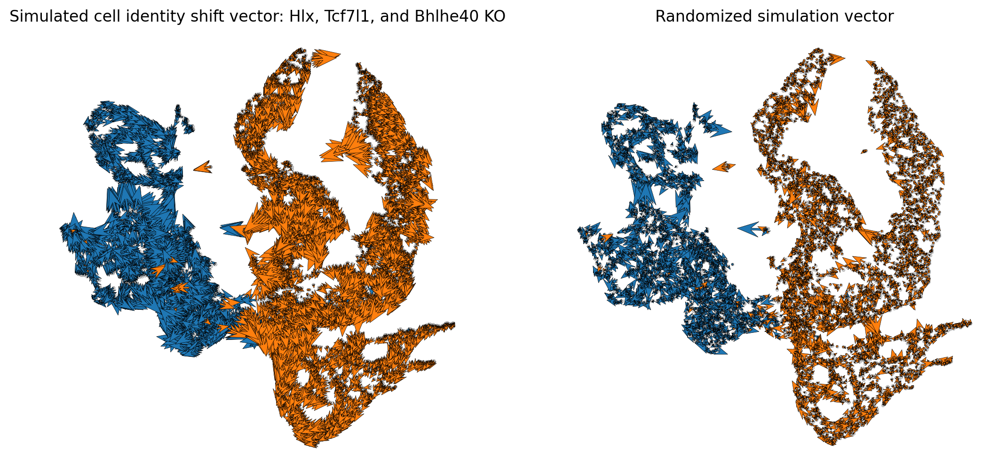

In [96]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 25
# Show quiver plot
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {genes_of_interest} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [97]:
# n_grid = 40 is a good starting value.
n_grid = 40
oracle.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)

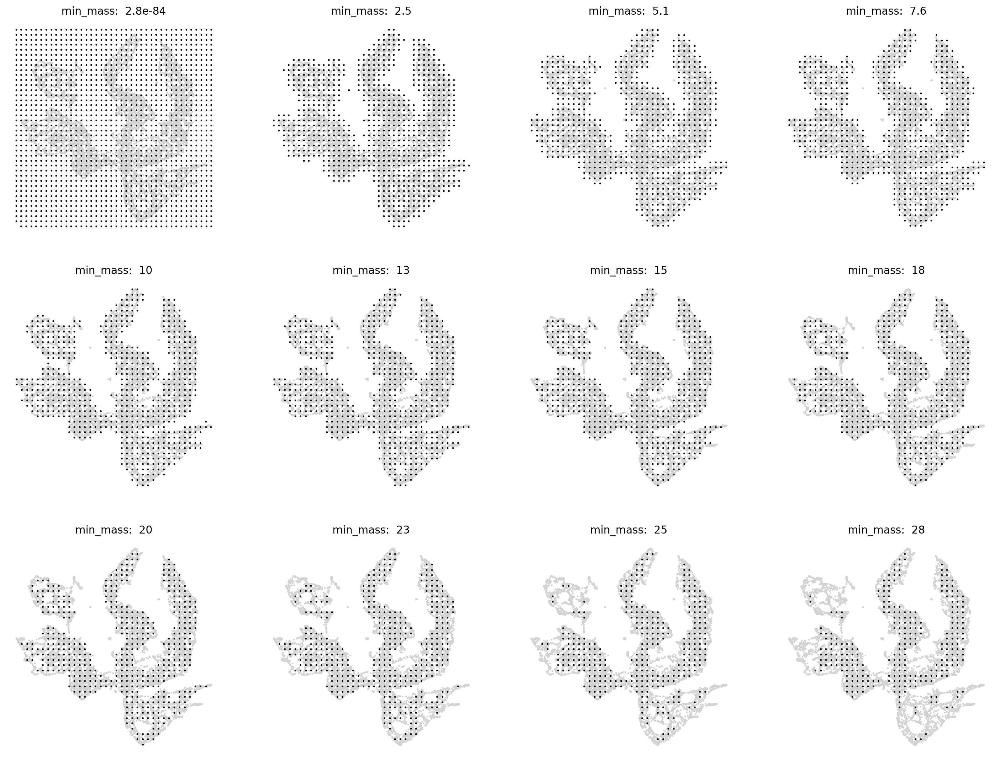

In [98]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)



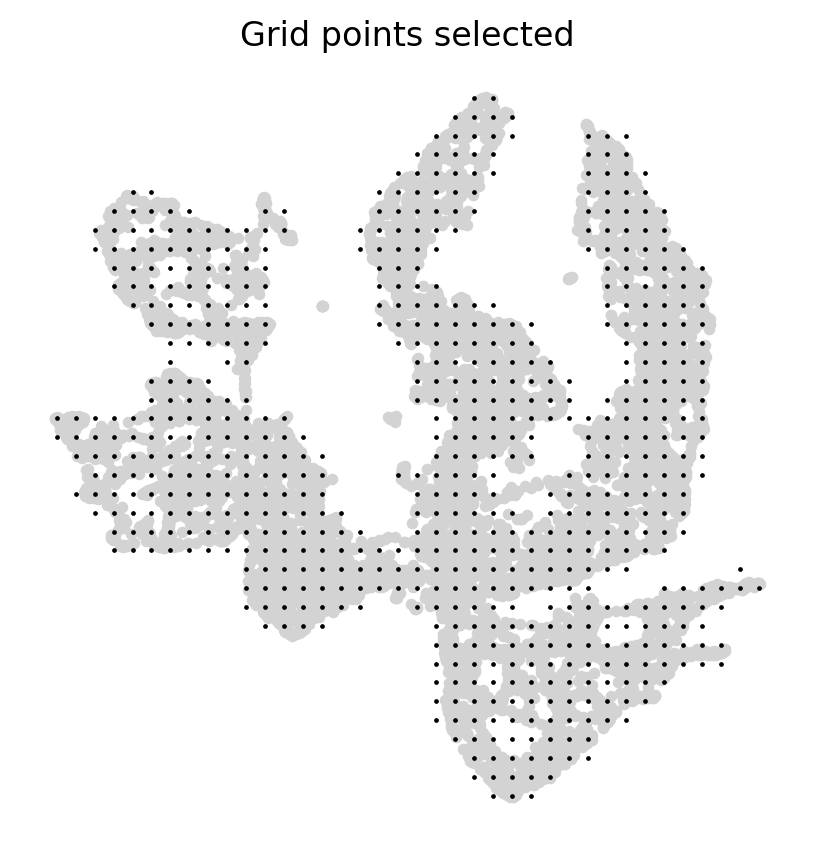

In [99]:
min_mass = 10  #1.5 #2.9e+04  # 5e+03 4.9e+03 #1.9e+04
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

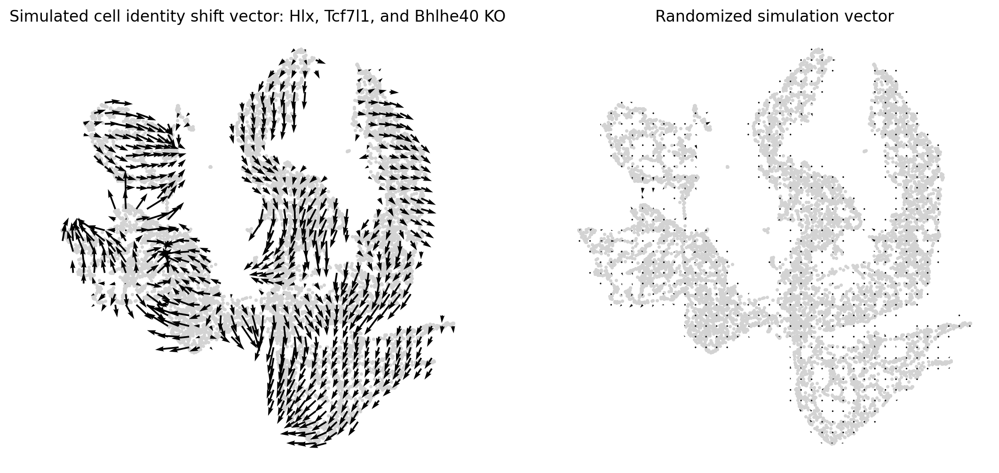

In [100]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 15
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {genes_of_interest} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

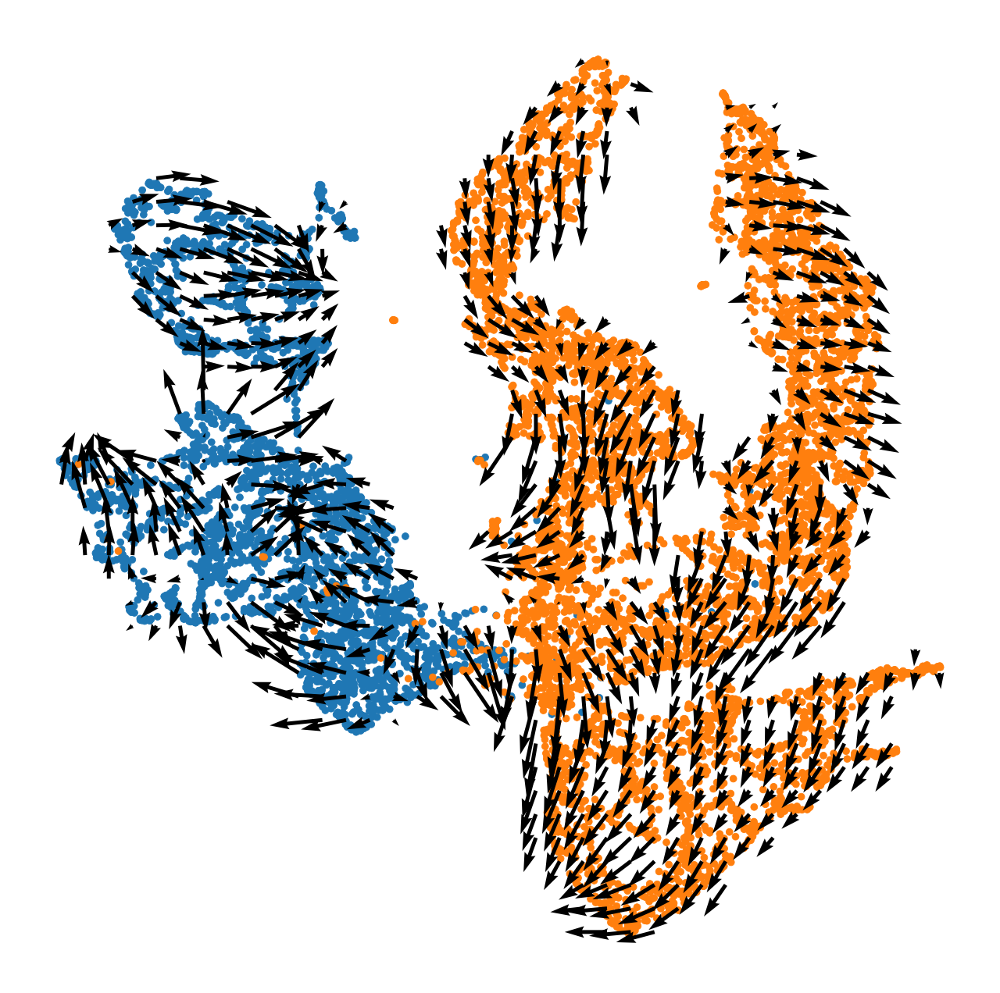

In [101]:
# Plot vector field with cell cluster
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

# Compare Simulation Vector with Development Vectors

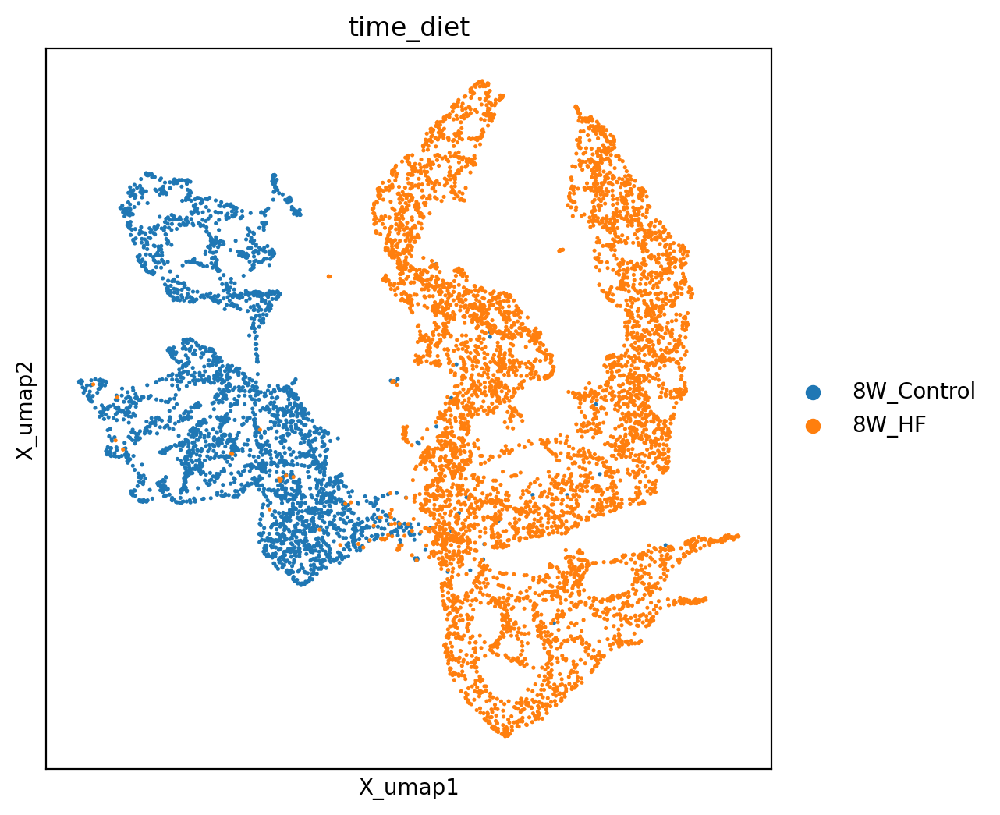

In [102]:
# Visualize pseudotime
fig, ax = plt.subplots(figsize=[6,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow",
                color=['time_diet'])

In [103]:
from celloracle.applications import Gradient_calculator

# Instantiate Gradient calculator object
gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="dpt_pseudotime")


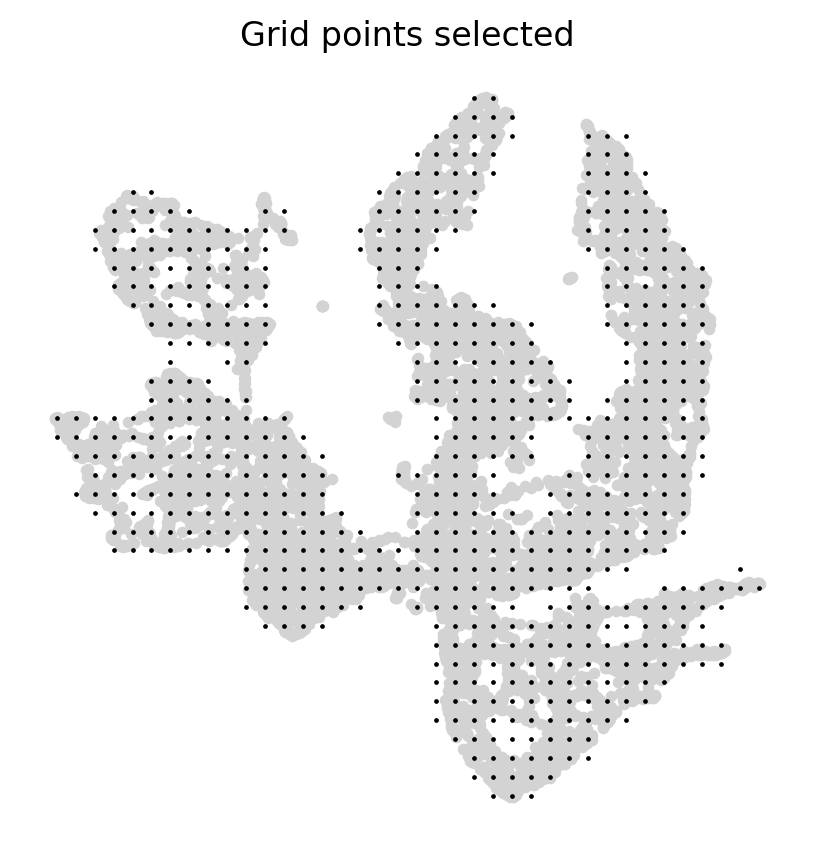

In [104]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

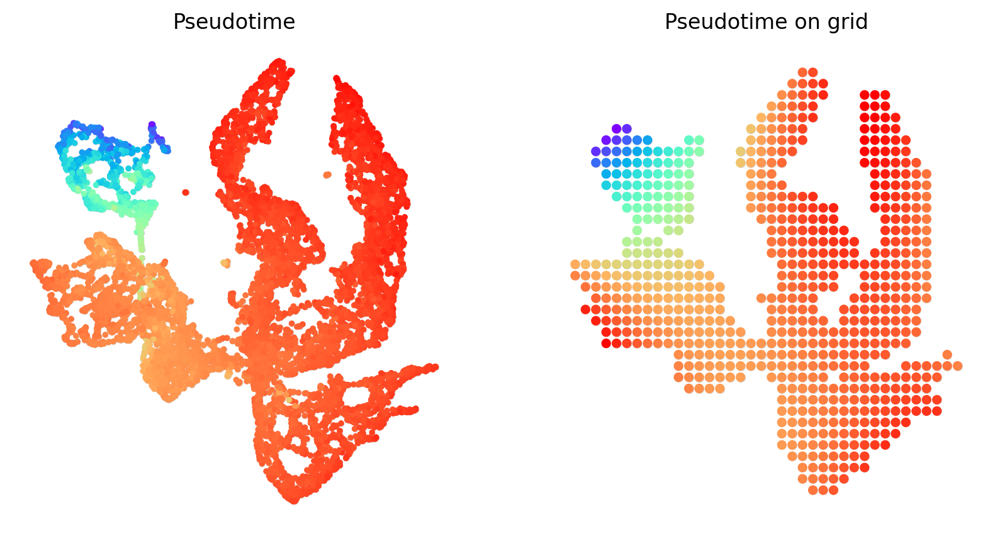

In [105]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)# title ='Female: 8W Control vs. 8W HF')

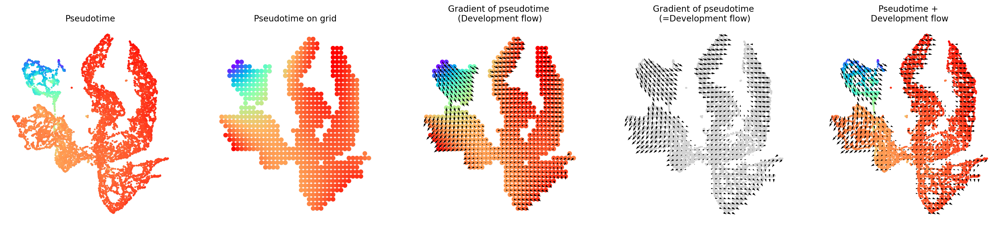

In [106]:
# Calculate gradient
gradient.calculate_gradient()

# Show results
scale_dev = 40
gradient.visualize_results(scale=scale_dev, s=5)



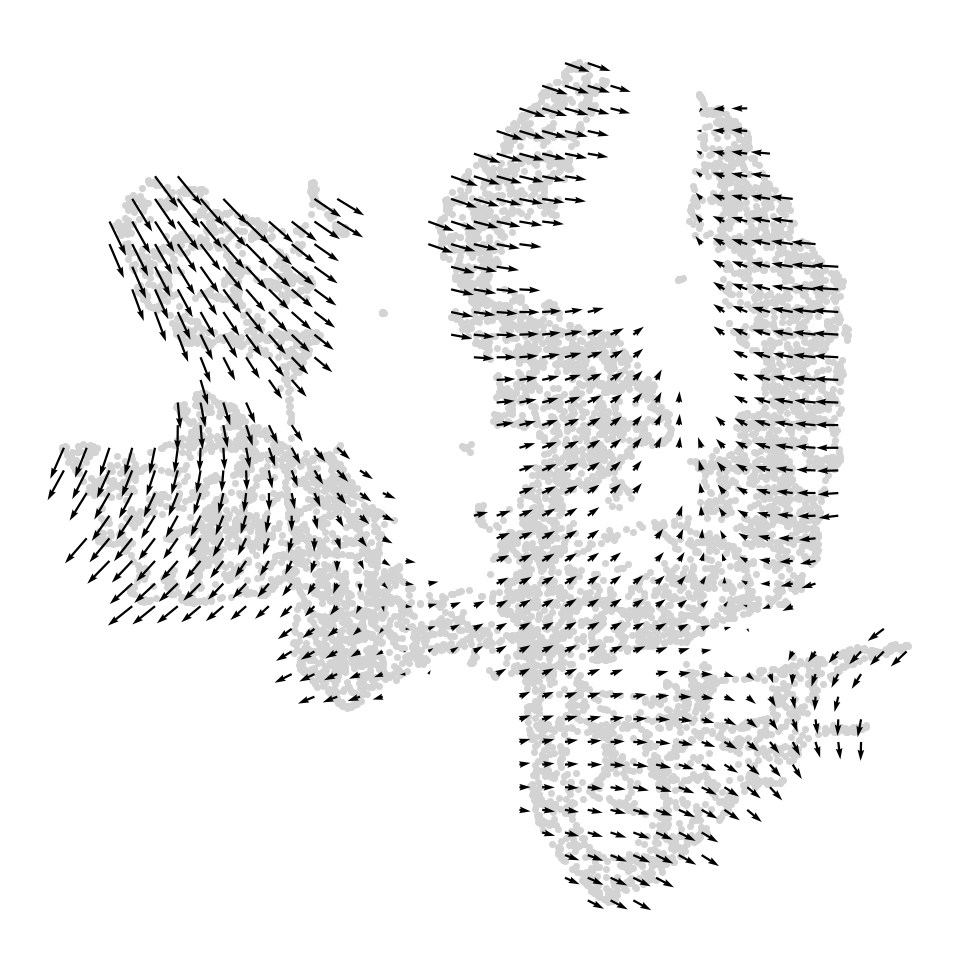

In [107]:
# Visualize results
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [108]:
from celloracle.applications import Oracle_development_module

# Make Oracle_development_module to compare two vector field
dev = Oracle_development_module()

# Load development flow
dev.load_differentiation_reference_data(gradient_object=gradient)

# Load simulation result
dev.load_perturb_simulation_data(oracle_object=oracle)


# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)



/Users/derekebowman/Coding Projects/CellOracle_2.0/celloracle/visualizations/development_module_visualization.py:103: UserWarning: You passed both c and facecolor/facecolors for the markers. c has precedence over facecolor/facecolors. This behavior may change in the future.
  ax.scatter(self.gridpoints_coordinates[~mass_filter, 0],


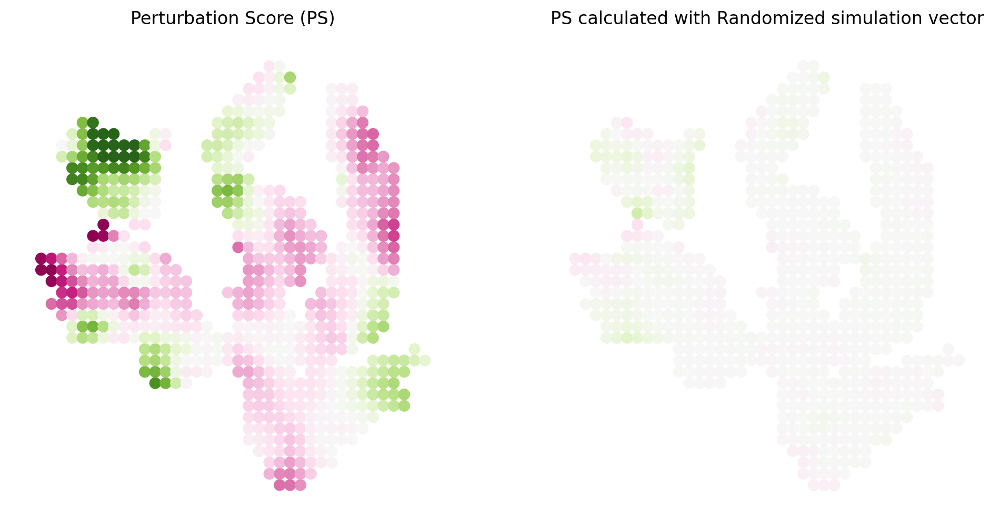

In [109]:
# Show perturbation scores
vm = 0.75

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax[0])
ax[0].set_title(f"Perturbation Score (PS)")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()



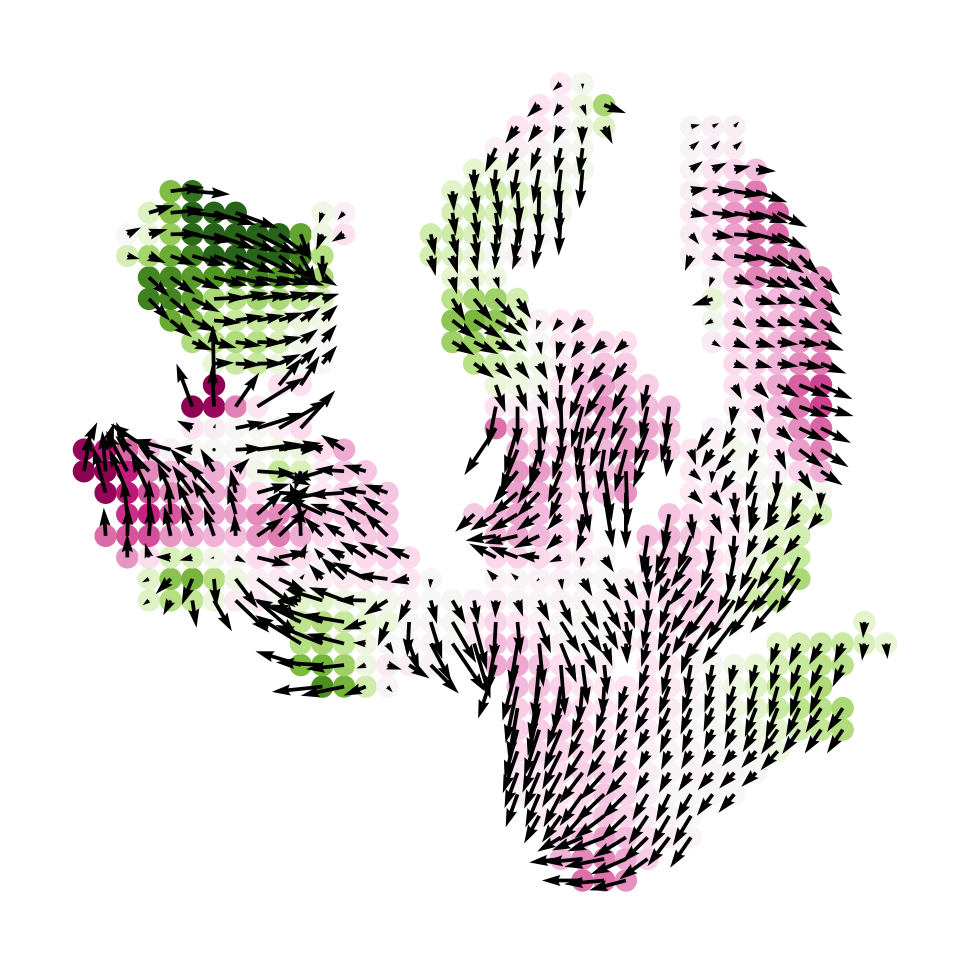

In [110]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

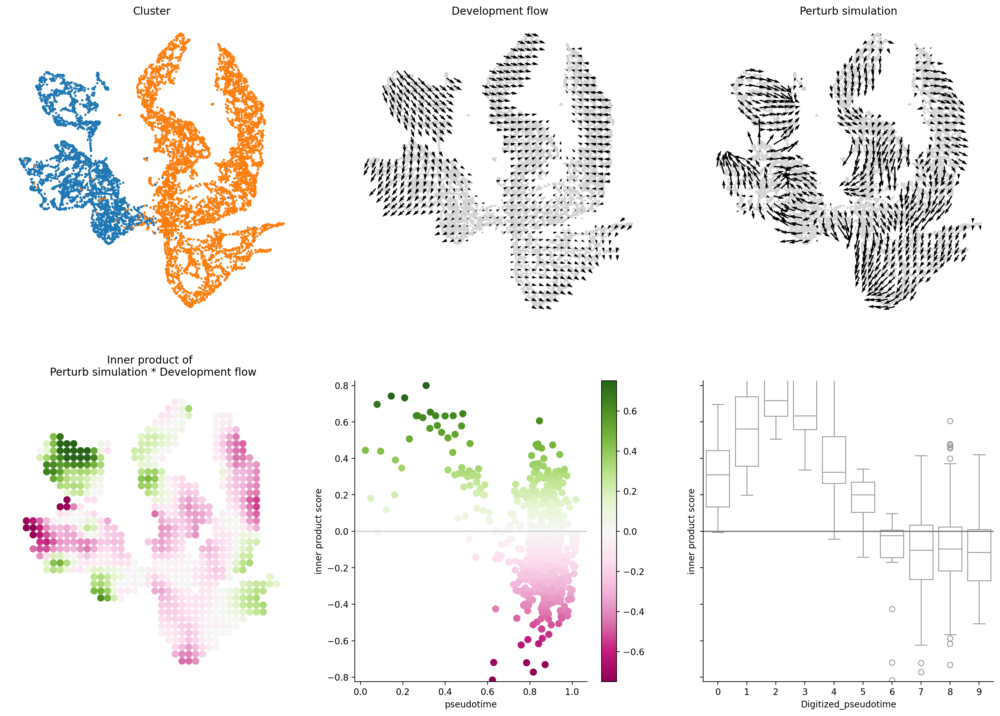

In [111]:
# Let's visualize the results
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm)
                                          #title=['','','','','',''], 
                                          #legend= [['Control', 'HF']], 
                                          #label_colors= ["#007aa5", "#ff9000"] ) # Blue and Orange



